## 0. Setup

In [4]:
import numpy as np
import pandas as pd
import shap
from tqdm import tqdm
from matplotlib import pyplot as plt
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
from lightgbm import LGBMRegressor, LGBMClassifier, plot_tree, create_tree_digraph, plot_metric
import warnings
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
from boruta import BorutaPy

import preprocessing as pp
import train_test_sets

warnings.filterwarnings('ignore')
pd.set_option('display.max_column', None)
pd.set_option('display.max_rows', None)


#mri_subs_path = "/home/brunovieira/Tamires_Experiments/Bases_de_Dados/MRI_Data_Voxels_894.parquet"
#mri_areas_path = "/home/brunovieira/Tamires_Experiments/Bases_de_Dados/MRI_Data_Areas_890.csv" 
#bb_path = "/home/brunovieira/Tamires_Experiments/Bases_de_Dados/BigBrain.xlsx"
#ids_path = "/home/brunovieira/Tamires_Experiments/Bases_de_Dados/participants_nkienhanced.tsv"

mri_subs_path_v2 = "/home/brunovieira/Tamires_Experiments/Bases_de_Dados/MRI_2_anualrate_894_v2.parquet" 
mri_subs_path_v1 = "/home/brunovieira/Tamires_Experiments/Bases_de_Dados/MRI_2_anualrate_894.parquet"
dict_dkt_path = "/home/brunovieira/Tamires_Experiments/Bases_de_Dados/Dict_structures_DKT.csv"
dict_econo_path = "/home/brunovieira/Tamires_Experiments/Bases_de_Dados/Dict_structures.csv"

In [5]:
def read_database(atlas):
    if atlas == 'Economo':
        # read df
        df = pd.read_parquet(mri_subs_path_v1) 
        df[['hemisphere','atlasEcono', 'handedness','sex', 'age']] = df[['hemisphere','atlasEcono', 'handedness','sex', 'age']].astype('int32')
        # add bb
        df = pp.bb_features(bb_path, df)
        df = df.dropna()
        # add name strutures and lobes
        Dict_structures_econo = pd.read_csv(dict_econo_path, sep=';', header=None)
        df = df.merge(Dict_structures_econo, how='left', left_on='atlasEcono', right_on=0)
        df = df.rename(columns = {1:'lobe', 2:'structure_name'})
        df = df.drop(columns=0)
    if atlas == 'DKT':
        # read df
        df = pd.read_parquet(mri_subs_path_v2) 
        df = df[df.atlasDF != -1.0]
        df = df.rename(columns = {'h_atlasDF':'h_structure'})
        # add name strutures and lobes
        Dict_structures_dkt = pd.read_csv(dict_dkt_path, sep=',', header=None)
        Dict_structures_dkt = Dict_structures_dkt.rename(columns = {2:'structure_name', 3:'lobe_name', 4:'lobe' })
        Dict_structures_dkt = Dict_structures_dkt.drop(columns=[0,1])
        df = df.join(Dict_structures_dkt, on='atlasDF') 
    return df

In [6]:
#df = read_database('Economo')
#df[['hemisphere','atlasEcono', 'h_structure', 'structure_name','lobe']].head()

In [7]:
df = read_database('DKT')
df[['hemisphere','atlasDF', 'h_structure', 'structure_name','lobe_name','lobe']].head()

,hemisphere,atlasDF,h_structure,structure_name,lobe_name,lobe
1,0.0,10.0,010,Isthmus Cingulate,Parietal,5.0
2,0.0,11.0,011,Lateral Occipital,Occipital,4.0
3,0.0,12.0,012,Lateral Orbito Frontal,Frontal,1.0
4,0.0,13.0,013,Lingual,Occipital,4.0
5,0.0,14.0,014,Medial Orbito Frontal,Frontal,1.0


'Isthmus Cingulate'

In [8]:
df.head()

,participant,age,sex,handedness,hemisphere,atlasDF,area,curv,sulc,thickness,bigbrain_layer_1,bigbrain_layer_2,bigbrain_layer_3,bigbrain_layer_4,bigbrain_layer_5,bigbrain_layer_6,h_structure,structure_name,lobe_name,lobe
1,A00008326,59.0,0.0,2.0,0.0,10.0,0.601876,-0.008262,0.125957,2.703677,0.109474,0.085556,0.277775,0.103513,0.205281,0.218400,010,Isthmus Cingulate,Parietal,5.0
2,A00008326,59.0,0.0,2.0,0.0,11.0,0.656662,-0.042081,-2.089579,2.515563,0.111468,0.097686,0.282431,0.106553,0.197702,0.204160,011,Lateral Occipital,Occipital,4.0
3,A00008326,59.0,0.0,2.0,0.0,12.0,0.673776,-0.049637,-1.078827,2.724164,0.105876,0.084844,0.277359,0.068916,0.221491,0.241514,012,Lateral Orbito Frontal,Frontal,1.0
4,A00008326,59.0,0.0,2.0,0.0,13.0,0.682724,-0.029710,-0.314644,1.864753,0.113680,0.093940,0.274428,0.130979,0.186600,0.200373,013,Lingual,Occipital,4.0
5,A00008326,59.0,0.0,2.0,0.0,14.0,0.667584,-0.043280,-2.774555,2.320056,0.115373,0.091310,0.273685,0.076120,0.214898,0.228614,014,Medial Orbito Frontal,Frontal,1.0


In [9]:
len(df.participant.unique())

871

-------------------

## 1. Regressao Polinomial e Derivada da Espessura

100%|██████████| 63/63 [00:03<00:00, 16.85it/s]


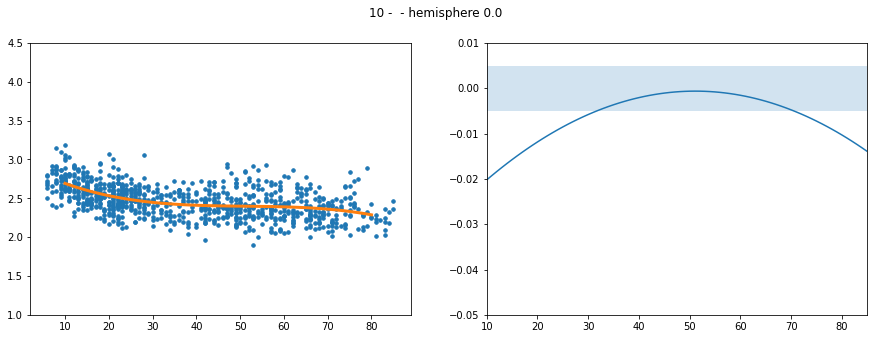

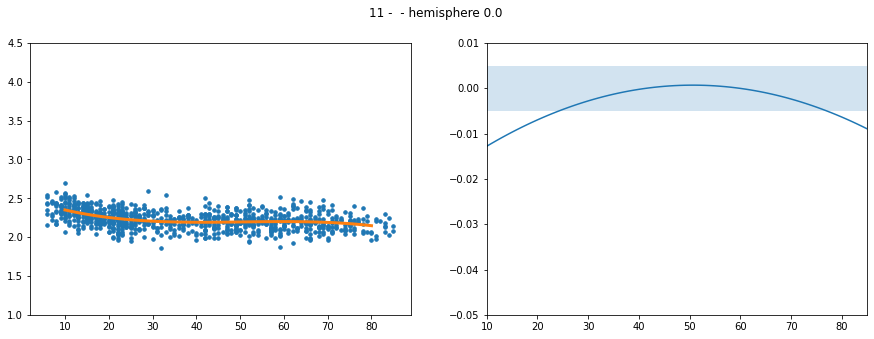

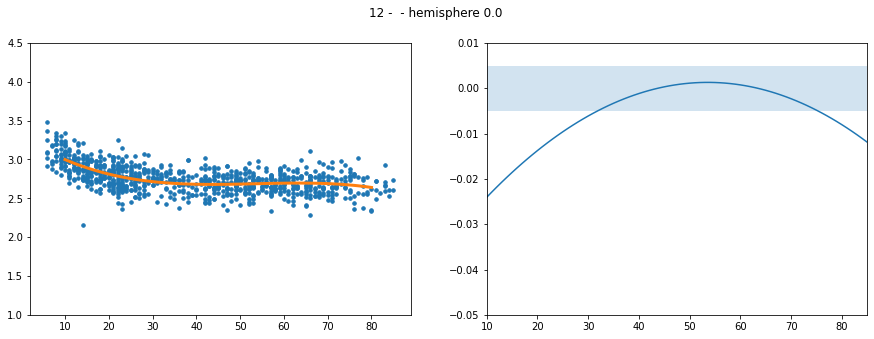

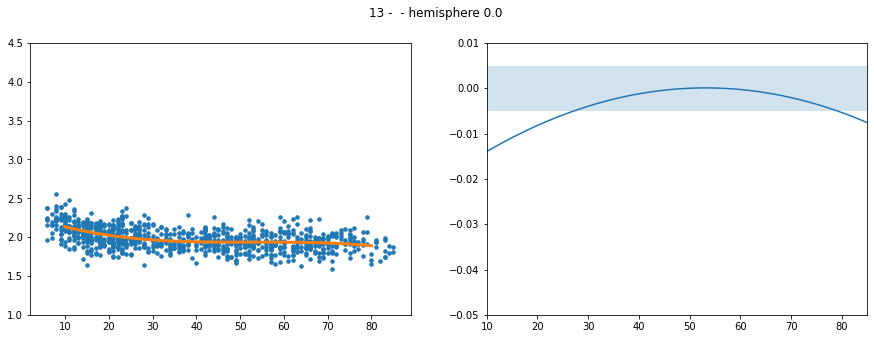

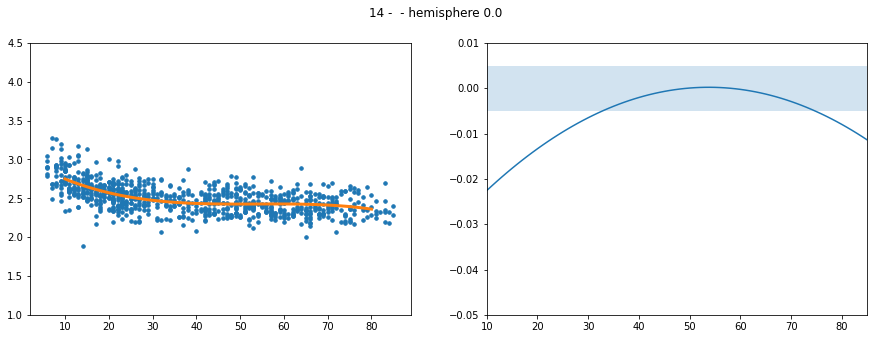

...

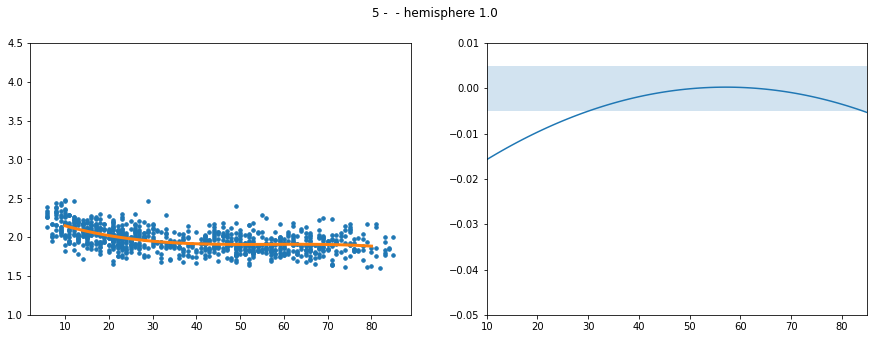

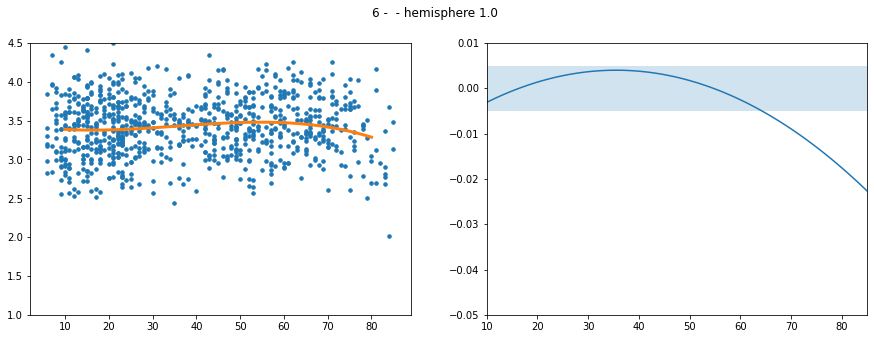

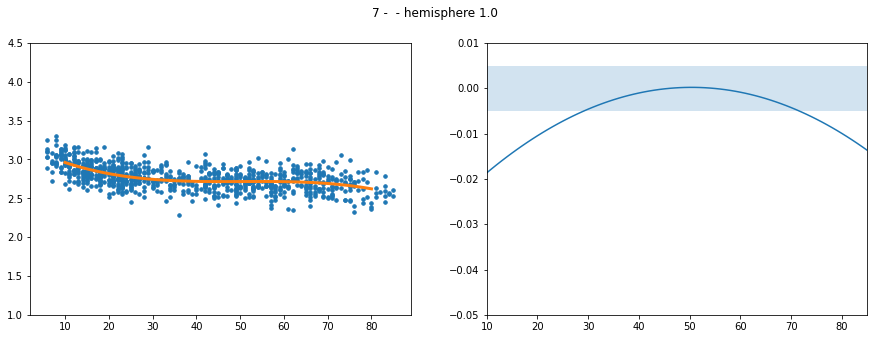

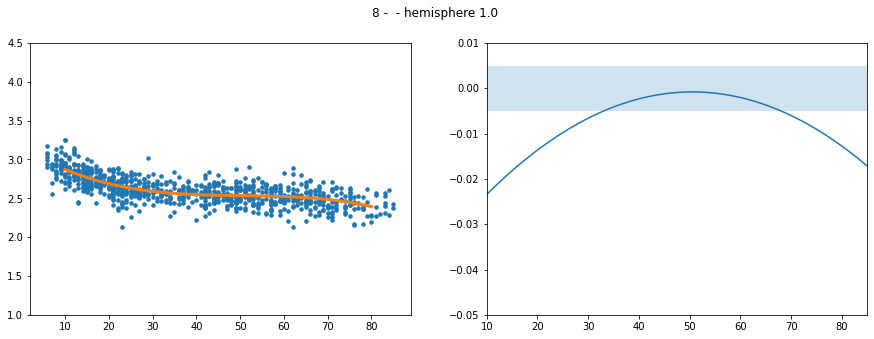

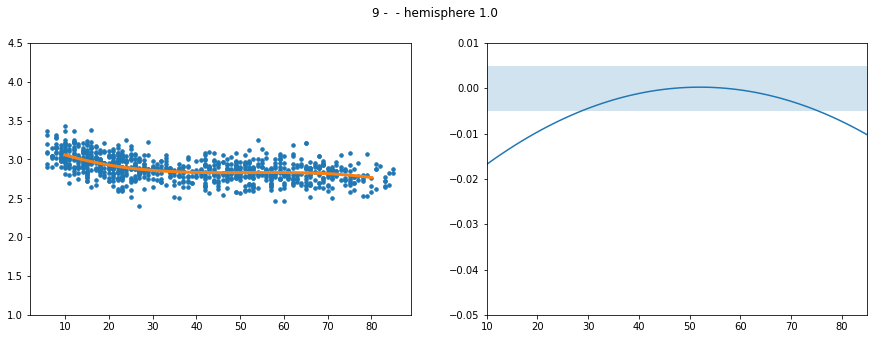

In [10]:
# ordenacao
h_structures = np.sort(df.h_structure.unique())


taxa_anual =[]
for h_structure in tqdm(h_structures):
    
    # variacao da espessura
    age = df[df.h_structure == h_structure].age
    thickness = df[df.h_structure == h_structure].thickness
    z = np.polyfit(age, thickness, 3)
    p = np.poly1d(z)
    xp = np.linspace(10, 80, 100)
    
    # variacao da variacao da espessura
    p2 = np.polyder(p)
    derivada = []
    for year in range(0, 100):
        derivada.append(p2(year))
    taxa_anual.append([h_structure]+ derivada)
    
    # plots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,5))
    a = h_structure[1:]
    b = ' - '#+df[df.h_structure == h_structure].name.iloc[0] 
    c = ' - hemisphere '+ str(df[df.h_structure == h_structure].hemisphere.iloc[0])
    fig.suptitle(a+b+c)
    _ = ax1.plot(age, thickness, '.', xp, p(xp), '-', linewidth=3, markersize=7)
    ax1.axis(ymin=1,ymax=4.5)
    ax2.plot(derivada)
    ax2.axis(ymin=-0.05,ymax=0.01)
    ax2.axis(xmin=10,xmax=85)
    ax2.fill_between([10,85], 0.005, -0.005, alpha=.2)
    
taxa_anual = pd.DataFrame(taxa_anual)
taxa_anual = taxa_anual.rename(columns={0: "atlasDKT"})
taxa_anual.set_index('atlasDKT', inplace=True)

In [11]:
taxa_anual.head()

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100
atlasDKT,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
010,-0.030900,-0.029727,-0.028577,-0.027450,-0.026347,-0.025267,-0.024209,-0.023175,-0.022165,-0.021177,-0.020213,-0.019271,-0.018353,-0.017458,-0.016586,-0.015738,-0.014912,-0.014110,-0.013331,-0.012575,-0.011843,-0.011133,-0.010447,-0.009784,-0.009144,-0.008527,-0.007933,-0.007363,-0.006815,-0.006291,-0.005790,-0.005313,-0.004858,-0.004427,-0.004018,-0.003633,-0.003271,-0.002933,-0.002617,-0.002325,-0.002056,-0.001810,-0.001587,-0.001387,-0.001211,-0.001057,-0.000927,-0.000820,-0.000737,-0.000676,-0.000639,-0.000624,-0.000633,-0.000665,-0.000721,-0.000799,-0.000901,-0.001026,-0.001174,-0.001345,-0.001539,-0.001757,-0.001997,-0.002261,-0.002548,-0.002859,-0.003192,-0.003549,-0.003928,-0.004331,-0.004757,-0.005207,-0.005679,-0.006175,-0.006694,-0.007236,-0.007801,-0.008389,-0.009001,-0.009635,-0.010293,-0.010974,-0.011678,-0.012406,-0.013156,-0.013930,-0.014727,-0.015547,-0.016390,-0.017257,-0.018147,-0.019059,-0.019995,-0.020954,-0.021937,-0.022942,-0.023971,-0.025023,-0.026098,-0.027196
011,-0.020242,-0.019423,-0.018621,-0.017834,-0.017064,-0.016311,-0.015573,-0.014852,-0.014148,-0.013460,-0.012788,-0.012132,-0.011493,-0.010870,-0.010263,-0.009673,-0.009099,-0.008542,-0.008000,-0.007476,-0.006967,-0.006475,-0.005999,-0.005539,-0.005096,-0.004669,-0.004259,-0.003865,-0.003487,-0.003125,-0.002780,-0.002451,-0.002139,-0.001843,-0.001563,-0.001299,-0.001052,-0.000821,-0.000607,-0.000409,-0.000227,-0.000061,0.000088,0.000221,0.000337,0.000437,0.000521,0.000588,0.000639,0.000674,0.000693,0.000695,0.000680,0.000650,0.000603,0.000540,0.000460,0.000364,0.000252,0.000123,-0.000022,-0.000183,-0.000361,-0.000554,-0.000765,-0.000991,-0.001234,-0.001494,-0.001769,-0.002061,-0.002370,-0.002694,-0.003035,-0.003393,-0.003766,-0.004156,-0.004563,-0.004985,-0.005424,-0.005880,-0.006351,-0.006839,-0.007344,-0.007865,-0.008402,-0.008955,-0.009525,-0.010111,-0.010713,-0.011332,-0.011967,-0.012618,-0.013286,-0.013970,-0.014671,-0.015387,-0.016120,-0.016870,-0.017636,-0.018418
012,-0.037021,-0.035603,-0.034212,-0.032848,-0.031510,-0.030199,-0.028915,-0.027658,-0.026427,-0.025223,-0.024046,-0.022896,-0.021772,-0.020675,-0.019604,-0.018561,-0.017544,-0.016554,-0.015590,-0.014653,-0.013743,-0.012860,-0.012003,-0.011173,-0.010370,-0.009594,-0.008844,-0.008121,-0.007425,-0.006755,-0.006112,-0.005496,-0.004906,-0.004344,-0.003808,-0.003298,-0.002816,-0.002360,-0.001930,-0.001528,-0.001152,-0.000803,-0.000481,-0.000185,0.000084,0.000326,0.000541,0.000730,0.000892,0.001027,0.001136,0.001218,0.001273,0.001301,0.001303,0.001278,0.001227,0.001148,0.001043,0.000911,0.000753,0.000567,0.000355,0.000117,-0.000149,-0.000441,-0.000760,-0.001105,-0.001478,-0.001877,-0.002302,-0.002755,-0.003234,-0.003740,-0.004272,-0.004832,-0.005418,-0.006030,-0.006670,-0.007336,-0.008029,-0.008748,-0.009495,-0.010268,-0.011067,-0.011894,-0.012747,-0.013627,-0.014534,-0.015467,-0.016427,-0.017414,-0.018427,-0.019467,-0.020534,-0.021628,-0.022748,-0.023895,-0.025069,-0.026269
013,-0.021226,-0.020432,-0.019652,-0.018888,-0.018139,-0.017404,-0.016685,-0.015981,-0.015292,-0.014618,-0.013960,-0.013316,-0.012688,-0.012074,-0.011476,-0.010892,-0.010324,-0.009771,-0.009233,-0.008710,-0.008202,-0.007710,-0.007232,-0.006770,-0.006322,-0.005890,-0.005473,-0.005071,-0.004683,-0.004312,-0.003955,-0.003613,-0.003286,-0.002975,-0.002678,-0.002397,-0.002131,-0.001879,-0.001643,-0.001422,-0.001216,-0.001026,-0.000850,-0.000689,-0.000544,-0.000413,-0.000298,-0.000198,-0.000112,-0.000042,0.000013,0.000052,0.000077,0.000087,0.000081,0.000061,0.000025,-0.000025,-0.000091,-0.000172,-0.000268,-0.000379,-0.0005

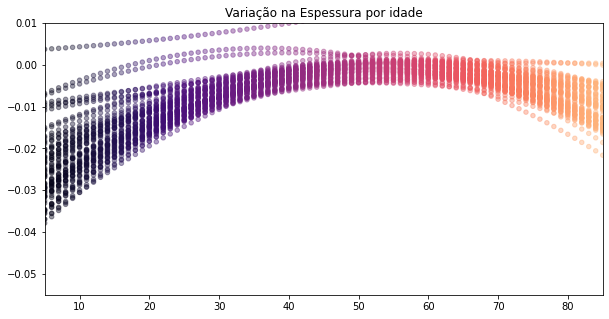

In [12]:
# Referencia
plt.figure(figsize=(10,5))
plt.title('Variação na Espessura por idade')
for i in range(len(taxa_anual)):
    plt.scatter(taxa_anual.columns, taxa_anual.iloc[i], alpha=0.4, c=taxa_anual.columns, cmap=plt.cm.magma, s=20)
    plt.xlim(5,85)
    plt.ylim(-0.055,0.01)
plt.show()

-------------------

## 2. Modelagem para prever variação de espessura anual

#### 2.1. DataSet

In [136]:
def rate(h_structure, age):
    return taxa_anual.loc[h_structure, age]

# add anual rate
df1 = df.copy()
df1['anual_rate'] = df1.apply(lambda x: rate(x.h_structure, x.age), axis=1)

# add initial thickness (at 10 years)
thickness10 = df1[df1.age == 10][['h_structure', 'thickness']].groupby(['h_structure']).mean()
thickness10 = thickness10.rename(columns={'thickness':'thickness10'})
df1 = df1.merge(thickness10, on='h_structure')

# uni os dados de cada idade
dfs = []
for h_structure in df.h_structure.unique():
    df0 = df1[df1.h_structure == h_structure].groupby(['age']).mean()
    df0['h_structure'] = h_structure
    df0['structure_name'] = np.array(df[df.h_structure == h_structure].structure_name[:1])[0]
    dfs.append(df0.reset_index())

df1 = pd.concat(dfs).reset_index(drop=True)

# check sum layers thickness
df1['thickness_layer_1'] = df1.thickness * df1.bigbrain_layer_1
df1['thickness_layer_2'] = df1.thickness * df1.bigbrain_layer_2
df1['thickness_layer_3'] = df1.thickness * df1.bigbrain_layer_3
df1['thickness_layer_4'] = df1.thickness * df1.bigbrain_layer_4
df1['thickness_layer_5'] = df1.thickness * df1.bigbrain_layer_5
df1['thickness_layer_6'] = df1.thickness * df1.bigbrain_layer_6
df1['sum_thickness_layers'] = df1['thickness_layer_1']+ df1['thickness_layer_2']+df1['thickness_layer_3']+df1['thickness_layer_4']+df1['thickness_layer_5']+df1['thickness_layer_6']
df1[['sum_thickness_layers', 'thickness']]

# change lobe
df1.lobe = [3 if x == 6 else x for x in df1.lobe]

# rename
df1.rename(columns= {'hemisphere':'Hemisphere',
                     'sex':'Gender', 
                     'age':'Age',
                     'lobe':'Lobe',
                     'thickness_layer_1': 'Layer I thickness',
                     'thickness_layer_2': 'Layer II thickness',
                     'thickness_layer_3': 'Layer III thickness',
                     'thickness_layer_4': 'Layer IV thickness',
                     'thickness_layer_5': 'Layer V thickness',
                     'thickness_layer_6': 'Layer VI thickness',
                     'thickness10':'Thickness at 10y.o.',
                     'sulc':'Curvature'
                     
                       }, inplace=True)


# show
df1.head()

,Age,Gender,handedness,Hemisphere,atlasDF,area,curv,Curvature,thickness,bigbrain_layer_1,bigbrain_layer_2,bigbrain_layer_3,bigbrain_layer_4,bigbrain_layer_5,bigbrain_layer_6,Lobe,anual_rate,Thickness at 10y.o.,h_structure,structure_name,Layer I thickness,Layer II thickness,Layer III thickness,Layer IV thickness,Layer V thickness,Layer VI thickness,sum_thickness_layers
0,6.0,0.714286,1.857143,0.0,10.0,0.655077,-0.027693,-0.111188,2.688395,0.108929,0.086125,0.280021,0.097536,0.207798,0.219592,5.0,-0.025267,2.794945,010,Isthmus Cingulate,0.292843,0.231538,0.752807,0.262214,0.558642,0.590351,2.688395
1,7.0,0.000000,1.666667,0.0,10.0,0.646284,-0.028095,-0.342735,2.710835,0.109105,0.085927,0.279501,0.098815,0.207318,0.219334,5.0,-0.024209,2.794945,010,Isthmus Cingulate,0.295767,0.232935,0.757680,0.267870,0.562005,0.594578,2.710835
2,8.0,0.333333,1.666667,0.0,10.0,0.652489,-0.024335,-0.139919,2.791334,0.108496,0.086202,0.280989,0.093905,0.209544,0.220863,5.0,-0.023175,2.794945,010,Isthmus Cingulate,0.302849,0.240619,0.784335,0.262121,0.584908,0.616503,2.791334
3,9.0,0.357143,1.642857,0.0,10.0,0.647904,-0.021873,-0.168052,2.704111,0.108857,0.085912,0.279355,0.099071,0.207251,0.219554,5.0,-0.022165,2.794945,010,Isthmus Cingulate,0.294362,0.232316,0.755407,0.267899,0.560429,0.593699,2.704111
4,10.0,0.500000,1.833333,0.0,10.0,0.645049,-0.019936,-0.040541,2.794945,0.108566,0.086038,0.279964,0.097067,0.208156,0.220209,5.0,-0.021177,2.794945,010,Isthmus Cingulate,0.303435,0.240472,0.782485,0.271296,0.581785,0.615472,2.794945


#### 2.3. Feature Analyses and Selection

In [160]:
features_sets = [['Age'],
                 
                 ['Thickness at 10y.o.', 
                  'Curvature', 
                  'Hemisphere', 'Gender',
                  'Lobe', 
                  'Layer I thickness','Layer II thickness','Layer III thickness',
                  'Layer IV thickness','Layer V thickness','Layer VI thickness'],
    
                 ['Age','Thickness at 10y.o.', 
                  'Curvature', 
                  'Hemisphere', 'Gender',
                  'Lobe', 
                  'Layer I thickness','Layer II thickness','Layer III thickness',
                  'Layer IV thickness','Layer V thickness','Layer VI thickness'],
                 
                ]


In [165]:
features_sets = [['Age'],
                 ['Age','Thickness at 10y.o.'],
                 ['Age','Layer I thickness'],
                 ['Age','Layer II thickness'],
                 ['Age','Layer III thickness'],
                 ['Age','Layer IV thickness'],
                 ['Age','Layer V thickness'],
                 ['Age','Layer VI thickness']]

#### 2.4. Model Training and Testing

In [166]:
inexplicable_strutures = {}
for key in pd.Series([x[1:] for x in df1.h_structure.unique()]).unique():
    inexplicable_strutures[key]=0
    
list_performance = []
testes = []
shap_info = []
lgbm_dict_list = []
X_train_dict_list = []

for features in tqdm(features_sets):    

    X = df1[features]
    y = df1.anual_rate
    performance = []
    lgbm_dict = {}
    X_train_dict = {}
    shap_values_ = {}
    expected_value = {}
    
    for i, struture in enumerate(set([x[1:] for x in df1.h_structure.unique()])):

        # Train Test Split
        test_index = df1[(df1.h_structure=='1'+struture)|(df1.h_structure=='0'+struture)].index
        train_index = set(df1.index)-set(test_index)
        X_train = X.loc[train_index]
        X_test = X.loc[test_index]
        y_train = y.loc[train_index]
        y_test = y.loc[test_index]
        
        # Model Train
        lgbm_dict[i] = LGBMRegressor()
        lgbm_dict[i].fit(X_train, y_train) #, categorical_feature = categorical_feature #fode o modelo usar categoricas
        
        # Model Test
        y_pred = lgbm_dict[i].predict(X_test)
        r2 = r2_score(y_test, y_pred)
        
        # SHAP
        X_train_dict[i] = X_train
        
        # Save Performance
        performance.append([struture,r2])
    
    # Save SHAP
    shap_info.append([[features], shap_values_, X_train_dict, expected_value])
    lgbm_dict_list.append(lgbm_dict)
    X_train_dict_list.append(X_train_dict)
    
    # Ajust and save to List of all Performance
    performance = pd.DataFrame(performance).sort_values(by=1, ascending=False)
    performance.columns = ['struture','r2']#+features
    performance['features'] = [features]*len(performance)
    list_performance.append(performance)
    
    # Handling Inexplicable strutures
    for key in performance[performance.r2<0].struture:
        inexplicable_strutures[key]=inexplicable_strutures[key]+1
    testes.append([features, performance.mean()[1], performance[performance.r2>0].mean()[1], len(performance[performance.r2<0])])
    
# Finishing
testes = pd.DataFrame(testes).rename(columns={0:'features',1:'r2_all',2:'r2_clean',3:'inexplicable_strutures'})

100%|██████████| 8/8 [01:15<00:00,  9.44s/it]


#### 2.4. Model Evaluation

In [167]:
testes

,features,r2_all,r2_clean,inexplicable_strutures
0,[Age],0.299335,0.837576,4
1,"[Age, Thickness at 10y.o.]",-0.095333,0.775298,6
2,"[Age, Layer I thickness]",0.224751,0.779200,3
3,"[Age, Layer II thickness]",0.374315,0.798636,3
4,"[Age, Layer III thickness]",0.229719,0.776275,3
5,"[Age, Layer IV thickness]",0.380514,0.831382,4
6,"[Age, Layer V thickness]",0.180156,0.819739,4
7,"[Age, Layer VI thickness]",0.349060,0.843379,5


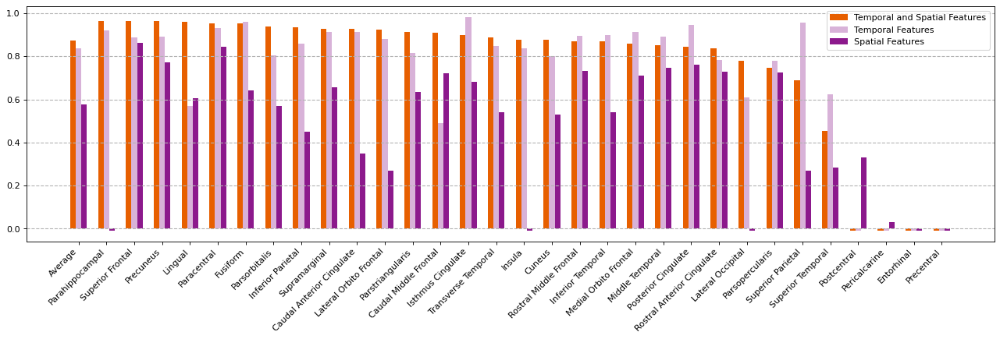

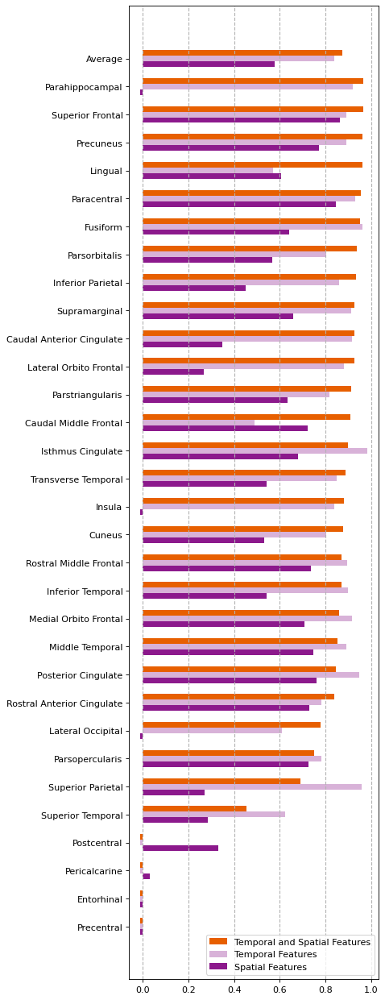

In [164]:
# unindo performace
df_performance = pd.concat([list_performance[2].rename(columns={'r2':'r2.2'}).drop(columns='features'),
                            list_performance[0].rename(columns={'r2':'r2.0'}).drop(columns=['features','struture']),
                            list_performance[1].rename(columns={'r2':'r2.1'}).drop(columns=['features','struture'])],
                           axis=1)
df_performance = df_performance.sort_values(by='r2.2',ascending=False).astype(float)
df_performance = pd.merge(df_performance,
                          df1[['structure_name','atlasDF']].drop_duplicates(),
                          left_on="struture", right_on="atlasDF")

# inexplicaveis
df_performance['r2.0'] = df_performance['r2.0'].mask(df_performance['r2.0'] < 0, -0.01) 
df_performance['r2.1'] = df_performance['r2.1'].mask(df_performance['r2.1'] < 0, -0.01) 
df_performance['r2.2'] = df_performance['r2.2'].mask(df_performance['r2.2'] < 0, -0.01)
df_performance['struture'].astype(str)
df_performance.reset_index(inplace=True)

# avarage
line = pd.DataFrame({'structure_name':'Average', 'struture':'Average','r2.0':testes.r2_clean[0],'r2.1':testes.r2_clean[1],'r2.2':testes.r2_clean[2],'index':-1},index=[0])
df_performance = line.append(df_performance).reset_index(drop=True)

# plot
plt.figure(figsize=(20, 5), dpi=80)
plt.bar(df_performance.index-0.2, df_performance['r2.2'], width=0.2, label = 'Temporal and Spatial Features',color='#e75f00',alpha=1)
plt.bar(df_performance.index+0.0, df_performance['r2.0'], width=0.2, label = 'Temporal Features',color='purple',alpha=0.3)
plt.bar(df_performance.index+0.2, df_performance['r2.1'], width=0.2, label = 'Spatial Features',color='purple',alpha=0.9)
plt.xticks(df_performance.index, df_performance.structure_name, rotation = 45, horizontalalignment = 'right')
plt.legend(loc='upper right')
plt.grid(axis='y',color='0.7', linestyle='--', linewidth=1)
plt.show()

# plot
plt.figure(figsize=(5, 20), dpi=80)
plt.barh(-df_performance.index+0.2, df_performance['r2.2'], height=0.2, label = 'Temporal and Spatial Features',color='#e75f00',alpha=1)
plt.barh(-df_performance.index+0.0, df_performance['r2.0'], height=0.2, label = 'Temporal Features',color='purple',alpha=0.3)
plt.barh(-df_performance.index-0.2, df_performance['r2.1'], height=0.2, label = 'Spatial Features',color='purple',alpha=0.9)
plt.yticks(-df_performance.index, df_performance.structure_name, horizontalalignment = 'right')
plt.legend()
plt.grid(axis='x',color='0.7', linestyle='--', linewidth=1)
plt.show()


In [55]:
model = 1
list_performance[model]

,struture,r2,features
21,16,0.963690,"[Thickness at 10y.o., Curvature, Hemisphere, G..."
28,28,0.963619,"[Thickness at 10y.o., Curvature, Hemisphere, G..."
1,25,0.963400,"[Thickness at 10y.o., Curvature, Hemisphere, G..."
12,13,0.961352,"[Thickness at 10y.o., Curvature, Hemisphere, G..."
16,17,0.954330,"[Thickness at 10y.o., Curvature, Hemisphere, G..."
29,7,0.952592,"[Thickness at 10y.o., Curvature, Hemisphere, G..."
20,19,0.937729,"[Thickness at 10y.o., Curvature, Hemisphere, G..."
11,8,0.935036,"[Thickness at 10y.o., Curvature, Hemisphere, G..."
3,31,0.927939,"[Thickness at 10y.o., Curvature, Hemisphere, G..."
26,2,0.926807,"[Thickness at 10y.o., Curvature, Hemisphere, G..."


In [56]:
explicables = list_performance[model][list_performance[model].r2 >0].struture
explicables_index = explicables.index.tolist()
explicables = [int(x) for x in explicables.tolist()]

inexplicables = list_performance[model][list_performance[model].r2 <0].struture
inexplicables = [int(x) for x in inexplicables.tolist()]
inexplicables

[22, 21, 6, 24]

#### 2.5 Final Model

In [60]:
# Take inexplicables
atlas = 'atlasDF' #'atlasEcono'
df1_ = df1[df1[atlas].isin(explicables)] 
print(len(df1[atlas].unique()))
print(len(df1_[atlas].unique()))

# Final Model
model=1
X = df1_[features_sets[model]]
y = df1_.anual_rate
lgbm = LGBMRegressor()
lgbm.fit(X, y)

31
27


LGBMRegressor()

## 3. Explicabilidade

100%|██████████| 27/27 [00:10<00:00,  2.64it/s]


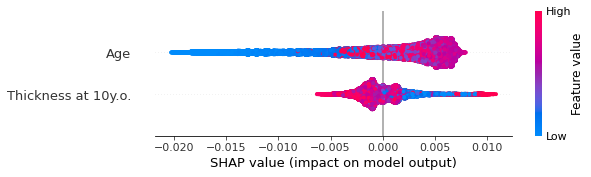

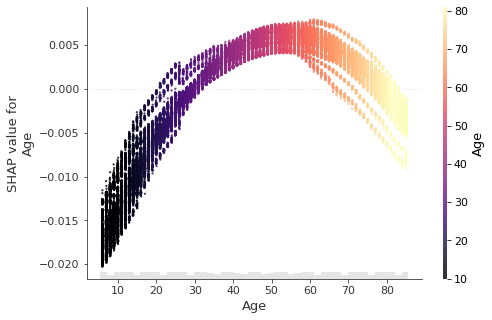

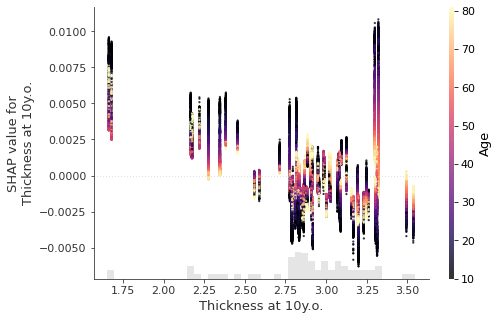

100%|██████████| 27/27 [00:09<00:00,  2.89it/s]


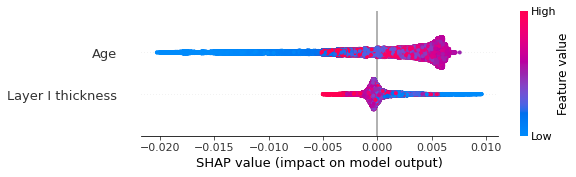

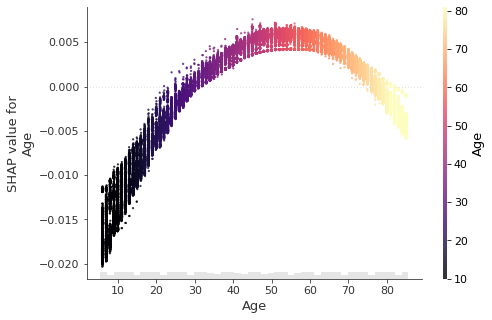

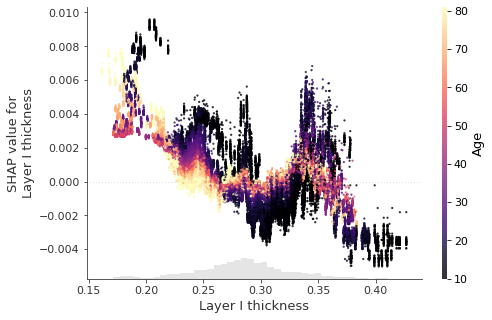

100%|██████████| 27/27 [00:10<00:00,  2.64it/s]


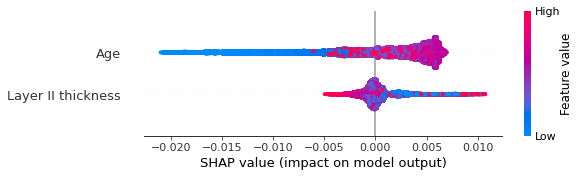

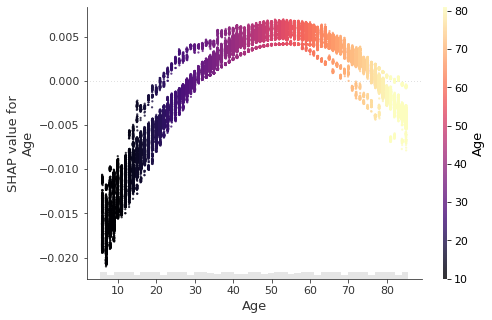

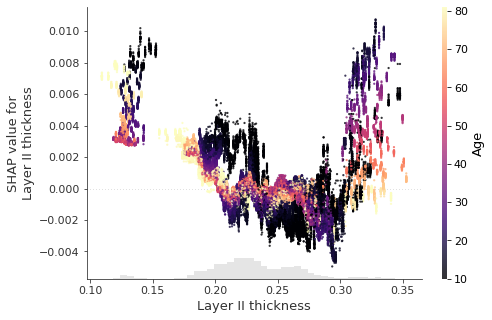

100%|██████████| 27/27 [00:09<00:00,  2.70it/s]


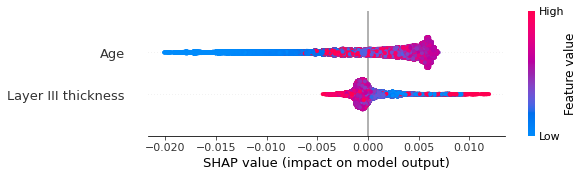

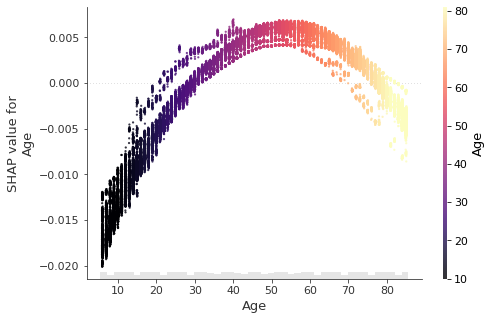

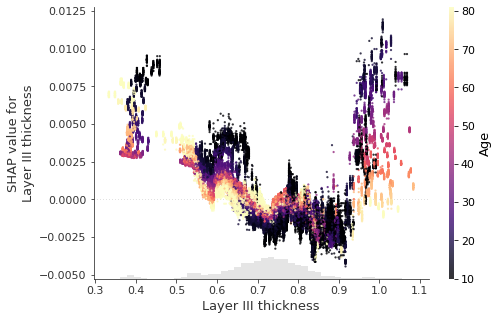

100%|██████████| 27/27 [00:10<00:00,  2.64it/s]


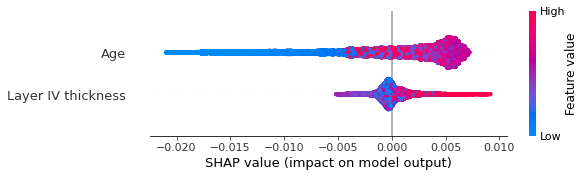

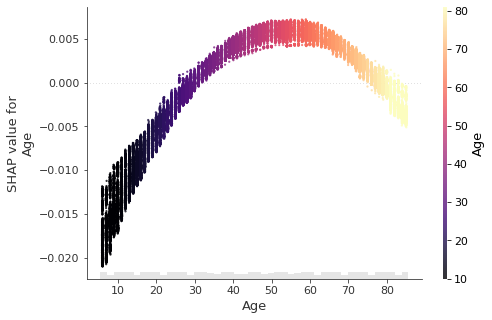

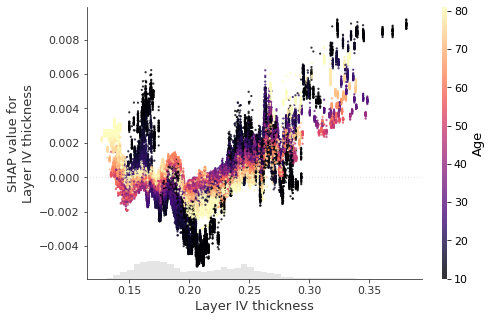

100%|██████████| 27/27 [00:09<00:00,  2.73it/s]


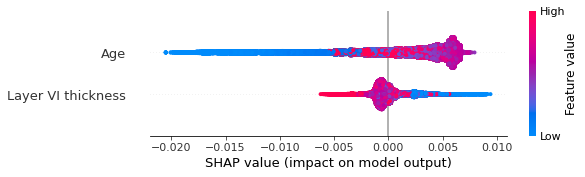

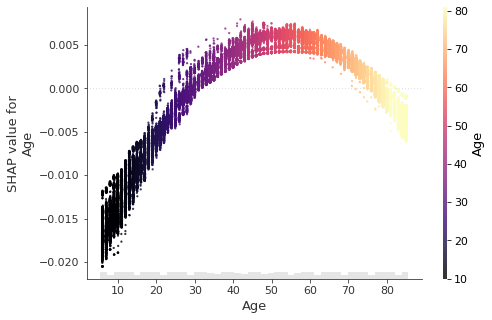

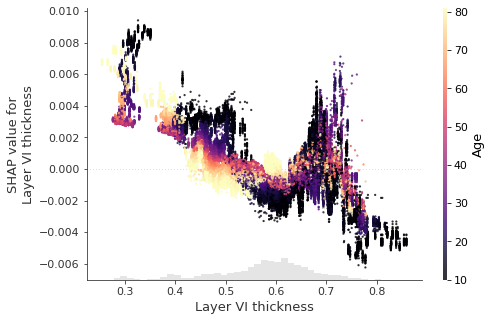

In [168]:
#model=2

for model in [1,2,3,4,5,7]:
    explainer = shap.Explainer(lgbm_dict_list[model][0])
    shap_complete = explainer(X_train_dict_list[model][0])
    for i in tqdm(explicables_index):
        explainer = shap.Explainer(lgbm_dict_list[model][i])
        shap_values = explainer(X_train_dict_list[model][i])
        shap_complete.values = np.append(shap_complete.values, shap_values.values,axis=0)
        shap_complete.base_values = np.append(shap_complete.base_values, shap_values.base_values,axis=0)
        shap_complete.data = np.append(shap_complete.data, shap_values.data,axis=0)

    # shap plot principal    
    shap.summary_plot(shap_complete)
    #shap.summary_plot(shap_complete, plot_type='bar',color='purple')

    for i in [0,1]:#range(12):

        shap.plots.scatter(shap_complete[:, i], color=shap_complete[:,"Age"], dot_size=5, cmap=plt.cm.magma, alpha =0.8) 
        #shap.plots.scatter(shap_complete[:, i], color=shap_complete[:,"Lobe"], dot_size=5, cmap=plt.cm.viridis, alpha =0.8)
        #shap.plots.scatter(shap_complete[:, i], color=shap_complete[:,'Layer I thickness'], dot_size=5, cmap=plt.cm.plasma, alpha =0.8)
        #shap.plots.scatter(shap_complete[:, i], color=shap_complete[:,'Thickness at 10y.o.'], dot_size=5, cmap=plt.cm.plasma, alpha =0.8)
        #shap.plots.scatter(shap_complete[:, i], color=shap_complete[:,'thickness_mean'], dot_size=5, cmap=plt.cm.plasma, alpha =0.8)
    

#### 3.1 Explicando Modelo Final SHAP

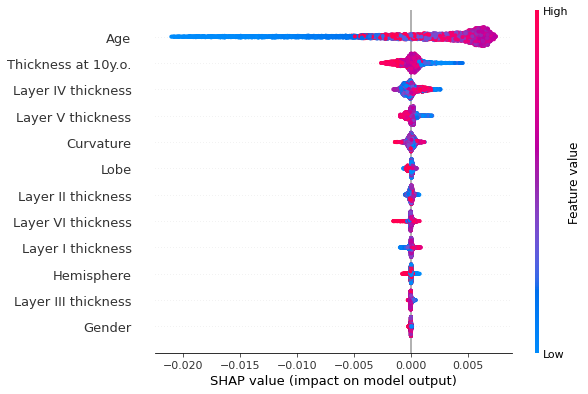

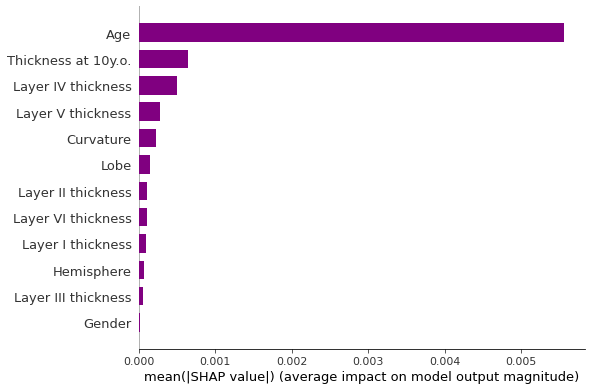

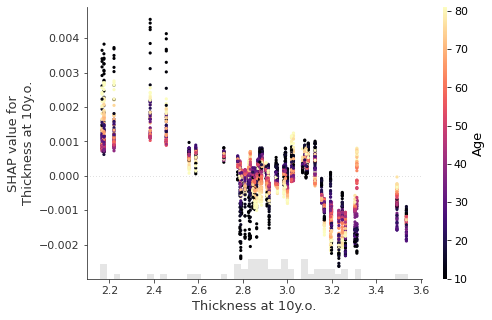

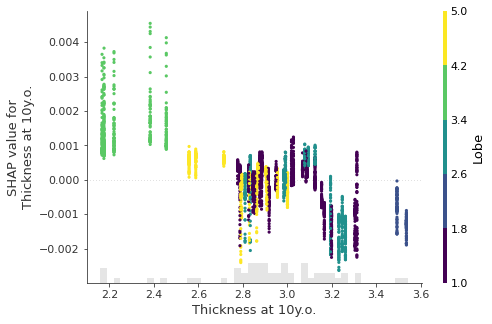

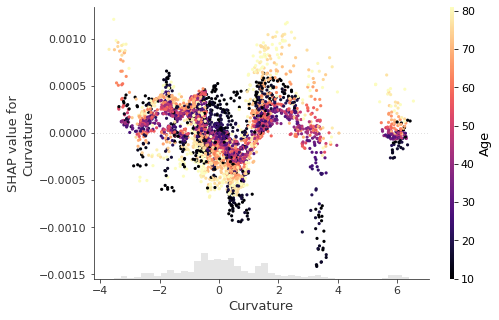

...

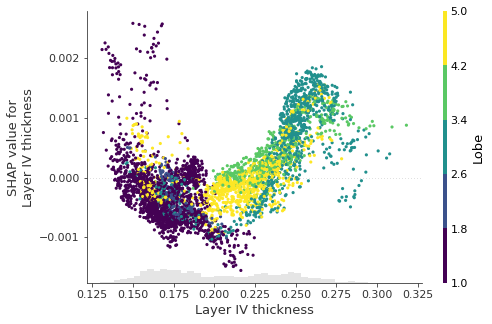

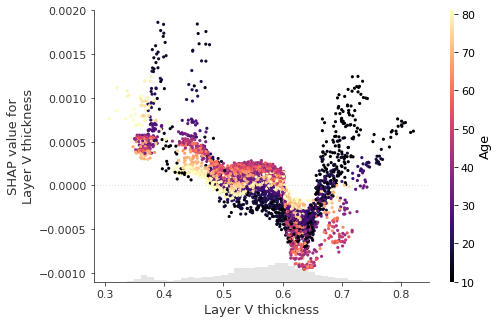

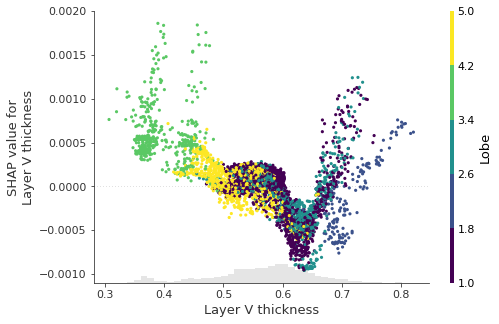

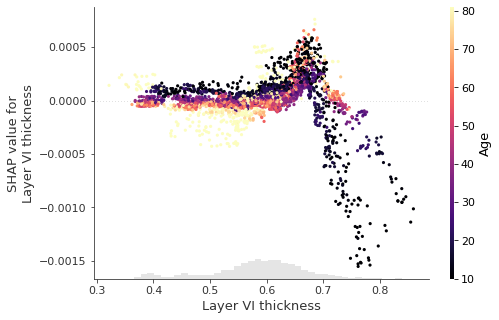

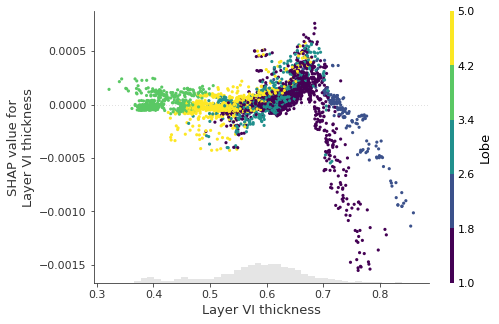

In [61]:
explainer = shap.Explainer(lgbm)
shap_info = explainer(X)

shap.summary_plot(shap_info)
shap.summary_plot(shap_info, plot_type='bar',color='purple')

for i in range(len(X.columns)):
    shap.plots.scatter(shap_info[:, i], color=shap_info[:,"Age"], dot_size=10, cmap=plt.cm.magma)
    shap.plots.scatter(shap_info[:, i], color=shap_info[:,"Lobe"], dot_size=10, cmap=plt.cm.viridis)

#### 3.2 Explicando Cross Validaion SHAP

100%|██████████| 27/27 [00:14<00:00,  1.84it/s]


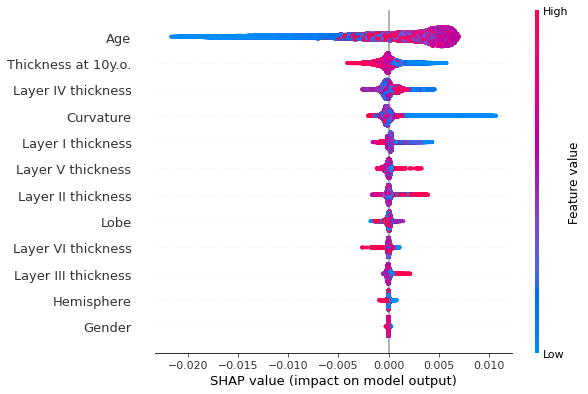

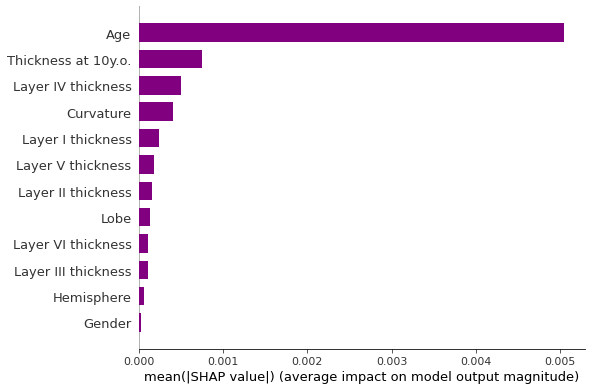

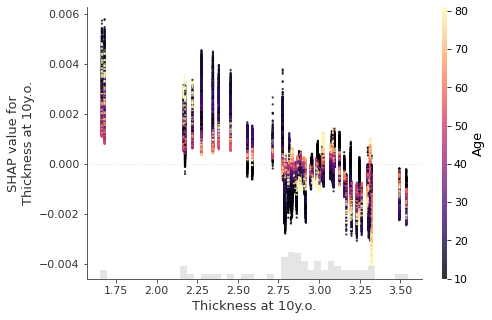

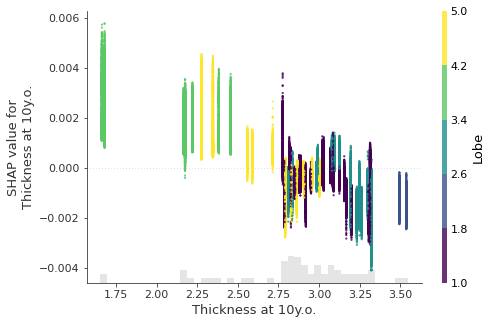

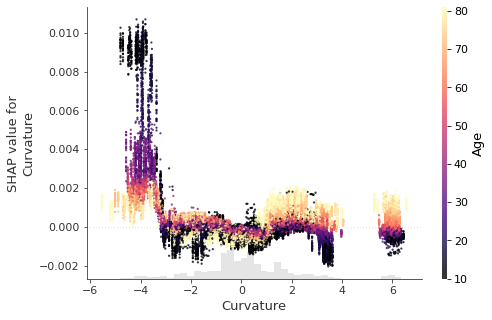

...

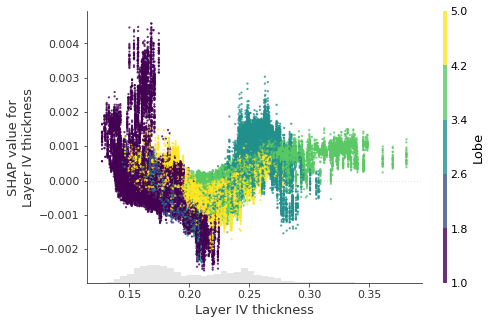

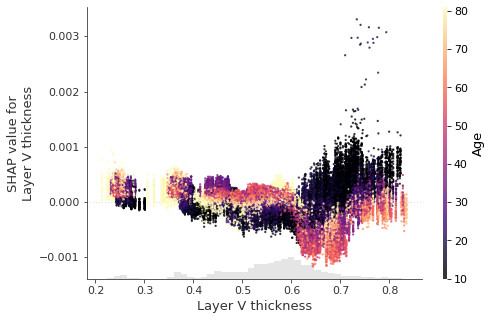

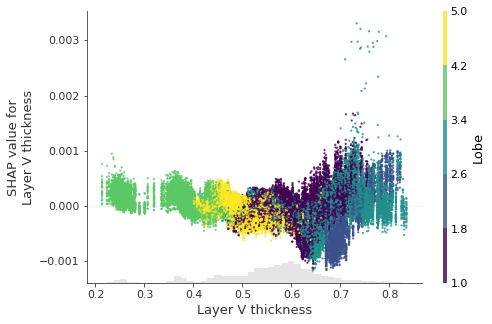

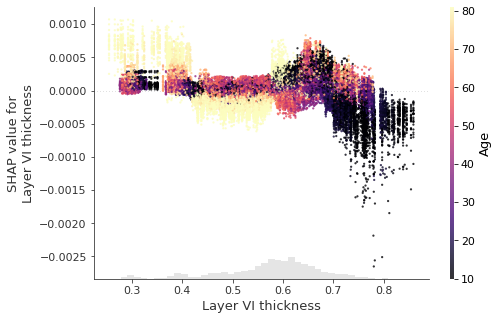

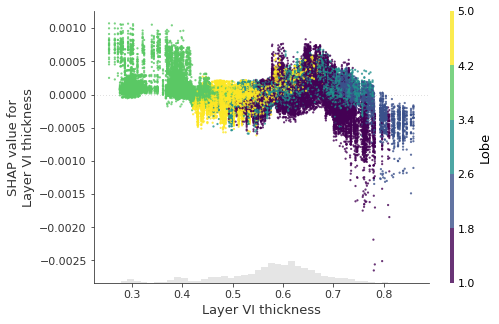

In [62]:
model=1
explainer = shap.Explainer(lgbm_dict_list[model][0])
shap_complete = explainer(X_train_dict_list[model][0])
X_train_info = X_train_dict_list[model][0]
for i in tqdm(explicables_index):
    explainer = shap.Explainer(lgbm_dict_list[model][i])
    shap_values = explainer(X_train_dict_list[model][i])
    shap_complete.values = np.append(shap_complete.values, shap_values.values,axis=0)
    shap_complete.base_values = np.append(shap_complete.base_values, shap_values.base_values,axis=0)
    shap_complete.data = np.append(shap_complete.data, shap_values.data,axis=0)
    # criado para definir a cor dos plots
    X_train_info = np.append(X_train_info, X_train_dict_list[model][i], axis=0)
    
# shap plot principal    
shap.summary_plot(shap_complete)
shap.summary_plot(shap_complete, plot_type='bar',color='purple')

for i in range(12):
    
    shap.plots.scatter(shap_complete[:, i], color=shap_complete[:,"Age"], dot_size=5, cmap=plt.cm.magma, alpha =0.8) #show=False
    #plt.savefig("my_dependence_plot.pdf",dpi=100)
    shap.plots.scatter(shap_complete[:, i], color=shap_complete[:,"Lobe"], dot_size=5, cmap=plt.cm.viridis, alpha =0.8)

#### 3.3 Explicando Arvores

In [601]:
boost = lgbm.booster_
df_tree = boost.trees_to_dataframe()
df_tree.head()
#create_tree_digraph(lgbm,show_info = ['split_gain','data_percentage'], precision=6, tree_index=99)

,tree_index,node_depth,node_index,left_child,right_child,parent_index,split_feature,split_gain,threshold,decision_type,missing_direction,missing_type,value,weight,count
0,0,1,0-S0,0-S1,0-S2,None,Age,0.137667,23.500000,<=,left,None,-0.007536,0,3680
1,0,2,0-S1,0-S4,0-S6,0-S0,Age,0.013404,13.500000,<=,left,None,-0.008671,828,828
2,0,3,0-S4,0-S11,0-S9,0-S1,atlasDF,0.002391,13.500000,<=,left,None,-0.009121,368,368
3,0,4,0-S11,0-L0,0-S16,0-S4,Layer_II_thickness,0.000826,0.246362,<=,left,None,-0.008803,144,144
4,0,5,0-L0,None,None,0-S11,None,NaN,NaN,None,None,None,-0.008527,62,62


#### 3.2 Explicando Modelos Cross-Validation 

100%|██████████| 23/23 [00:17<00:00,  1.35it/s]


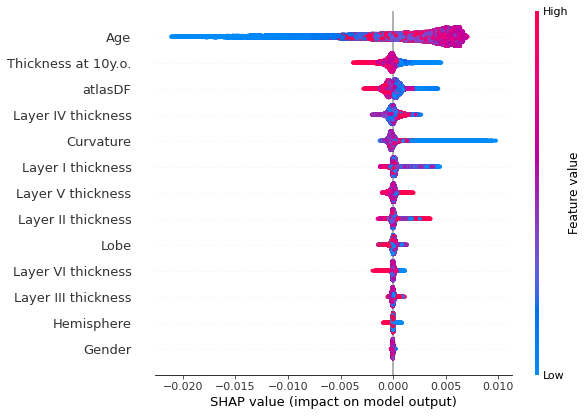

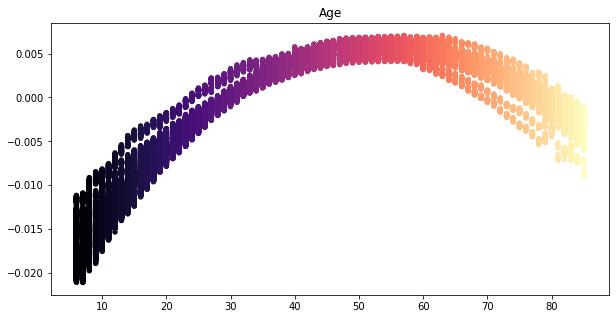

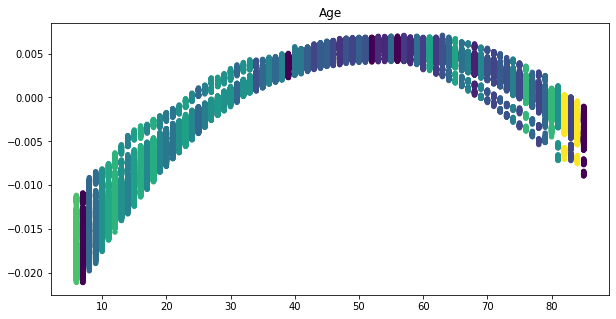

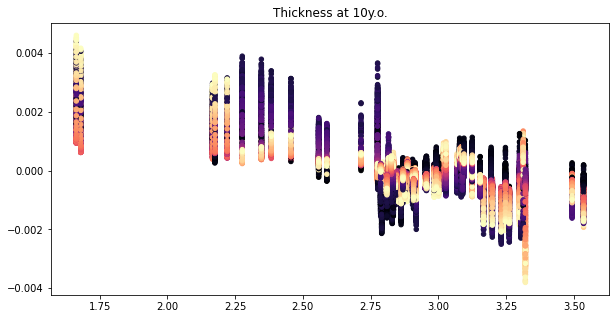

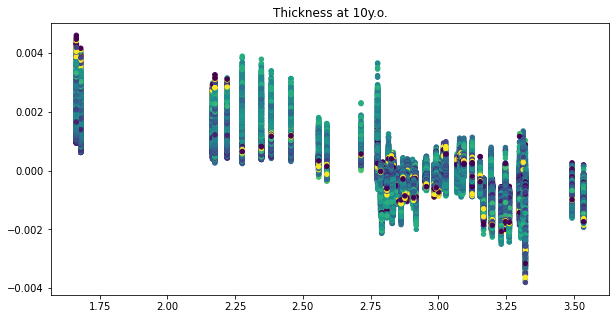

...

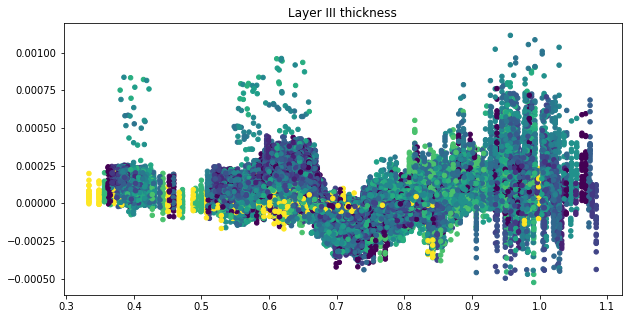

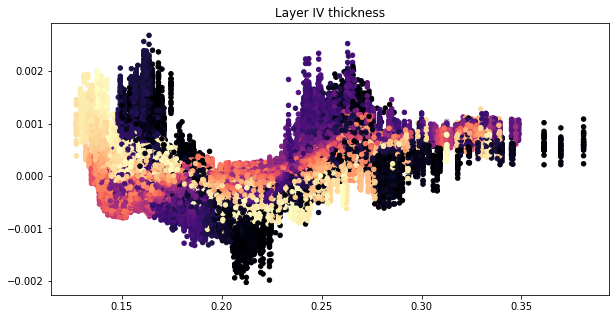

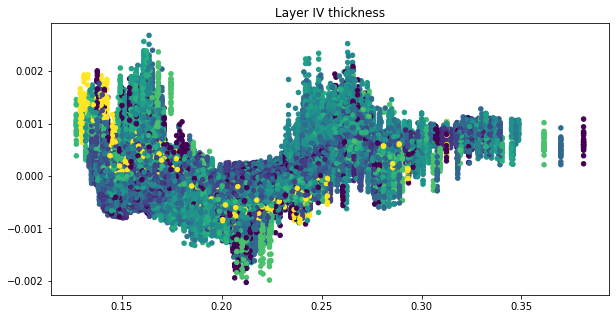

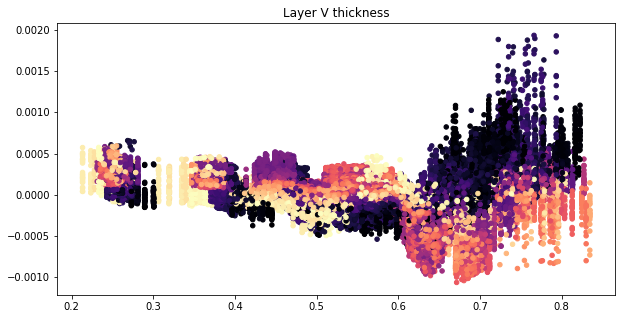

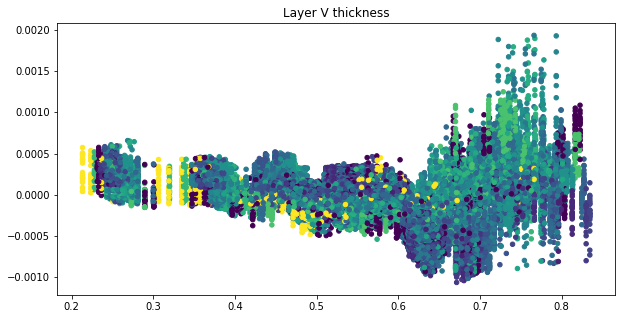

In [602]:
model = 1
explainer = shap.Explainer(lgbm_dict_list[model][0])
shap_complete = explainer(X_train_dict_list[model][0])
X_train_info = X_train_dict_list[model][0]
for i in tqdm(explicables_index):
    explainer = shap.Explainer(lgbm_dict_list[model][i])
    shap_values = explainer(X_train_dict_list[model][i])
    shap_complete.values = np.append(shap_complete.values, shap_values.values,axis=0)
    shap_complete.base_values = np.append(shap_complete.base_values, shap_values.base_values,axis=0)
    shap_complete.data = np.append(shap_complete.data, shap_values.data,axis=0)
    # criado para definir a cor dos plots
    X_train_info = np.append(X_train_info, X_train_dict_list[model][i], axis=0)
    
# shap plot principal    
shap.summary_plot(shap_complete)
shap.summary_plot(shap_complete, plot_type='bar',color='purple')


for i in range(12):
    plt.figure(figsize=(10,5))
    plt.title(str(X.columns[i]))
    plt.scatter(shap_complete.data[:,i], shap_complete.values[:,i], alpha=1, c=X_train_info[:,0], cmap=plt.cm.magma, s=20)
    plt.show()
    plt.figure(figsize=(10,5))
    plt.title(str(X.columns[i]))
    plt.scatter(shap_complete.data[:,i], shap_complete.values[:,i], alpha=1, c=X_train_info[:,5], cmap=plt.cm.viridis, s=20)
    plt.show()

In [ ]:
for i in range(len(lgbm_dict)):
    plot_tree(lgbm_dict[i], figsize = (30,30), show_info = ['split_gain','data_percentage'])         

-------------

## 4. Feature Analyses

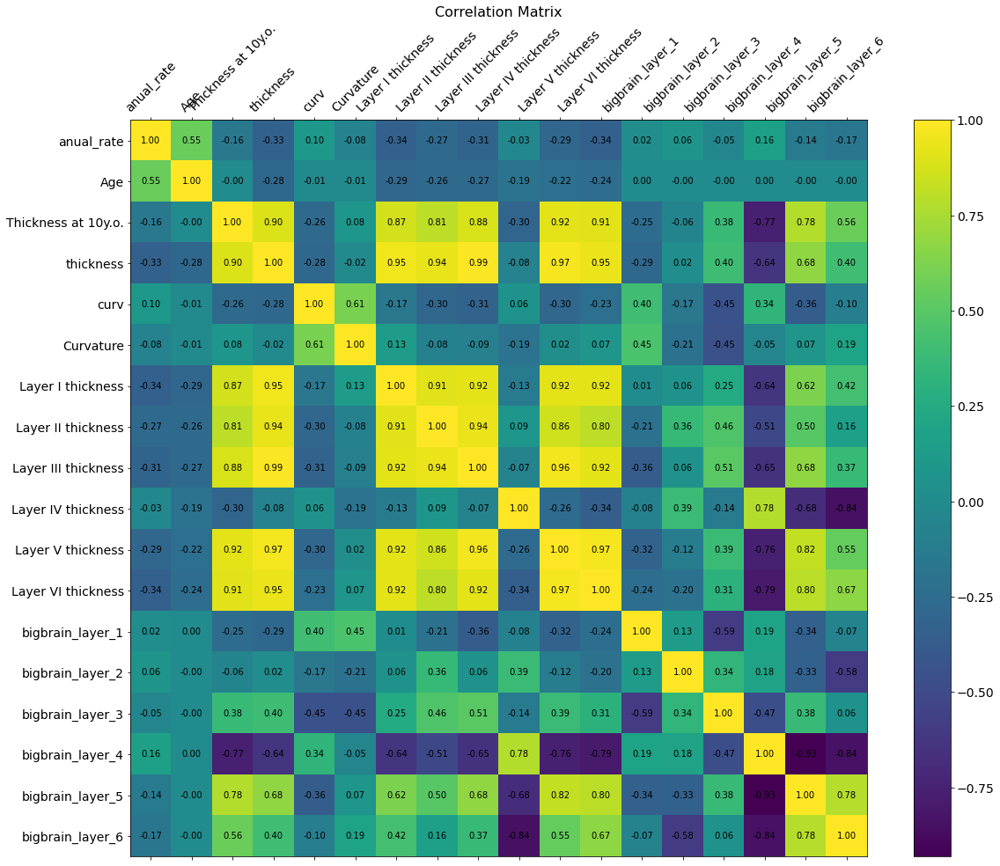

Iteration: 	1 / 100
Confirmed: 	0
Tentative: 	23
Rejected: 	0
Iteration: 	2 / 100
Confirmed: 	0
Tentative: 	23
Rejected: 	0
Iteration: 	3 / 100
Confirmed: 	0
Tentative: 	23
Rejected: 	0
Iteration: 	4 / 100
Confirmed: 	0
Tentative: 	23
Rejected: 	0
Iteration: 	5 / 100
Confirmed: 	0
Tentative: 	23
Rejected: 	0
Iteration: 	6 / 100
Confirmed: 	0
Tentative: 	23
Rejected: 	0
Iteration: 	7 / 100
Confirmed: 	0
Tentative: 	23
Rejected: 	0
Iteration: 	8 / 100
Confirmed: 	0
Tentative: 	23
Rejected: 	0
Iteration: 	9 / 100
Confirmed: 	0
Tentative: 	23
Rejected: 	0
Iteration: 	10 / 100
Confirmed: 	0
Tentative: 	23
Rejected: 	0
Iteration: 	11 / 100
Confirmed: 	0
Tentative: 	23
Rejected: 	0
Iteration: 	12 / 100
Confirmed: 	0
Tentative: 	23
Rejected: 	0
Iteration: 	13 / 100
Confirmed: 	0
Tentative: 	23
Rejected: 	0
Iteration: 	14 / 100
Confirmed: 	20
Tentative: 	3
Rejected: 	0
Iteration: 	15 / 100
Confirmed: 	20
Tentative: 	3
Rejected: 	0
Iteration: 	16 / 100
Confirmed: 	20
Tentative: 	3
Rejected: 	0
I

In [70]:
# Matriz de correlacao
df2corr = df1[['anual_rate','Age','Thickness at 10y.o.','thickness','curv', 'Curvature', 
              'Layer I thickness','Layer II thickness','Layer III thickness',
              'Layer IV thickness','Layer V thickness','Layer VI thickness',
              'bigbrain_layer_1','bigbrain_layer_2','bigbrain_layer_3',
              'bigbrain_layer_4','bigbrain_layer_5','bigbrain_layer_6']]

f = plt.figure(figsize=(19, 15))
s = 14
data = df2corr.corr()
plt.matshow(data, fignum=f.number)
for (x, y), value in np.ndenumerate(data):
    plt.text(x, y, f"{value:.2f}", va="center", ha="center")
plt.xticks(range(df2corr.select_dtypes(['number']).shape[1]), df2corr.select_dtypes(['number']).columns, fontsize=s, rotation=45)
plt.yticks(range(df2corr.select_dtypes(['number']).shape[1]), df2corr.select_dtypes(['number']).columns, fontsize=s)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=s)
plt.title('Correlation Matrix', fontsize=16);
plt.show()

# Boruta
X = df1.drop(columns =['anual_rate', 'atlasDF','Lobe']) 
y = df1.anual_rate

forest = RandomForestRegressor(n_jobs=-1, max_depth=20)
forest.fit(X, y)

feat_selector = BorutaPy(forest, n_estimators='auto', verbose=2, random_state=1, alpha= 0.001)
feat_selector.fit(X.to_numpy(), y)

feature_ranks = list(zip(X.columns, 
                         feat_selector.ranking_, 
                         feat_selector.support_,
                         forest.feature_importances_
                        ))
for feat in feature_ranks:
    print('Feature: {:<25} Rank: {},  Keep: {}, Importance: {}'.format(feat[0], feat[1], feat[2], feat[3]))

In [151]:
list_avg_rate = []

for i in df1.atlasDF.unique():
    
    df5 = df1[df1.atlasDF==i]
    
    avg_rate1 = df5[df1.Age<=30].anual_rate.mean()
    avg_rate2 = df5[(df1.Age<60) & (df1.Age>30)].anual_rate.mean()
    avg_rate3 = df5[df1.Age>=60].anual_rate.mean()
    
    t10 = df5['Thickness at 10y.o.'].mean()
    curv = df5.curv.mean()
    sulc = df5['Curvature'].mean()
    
    l1 = df5['Layer I thickness'].mean()
    b1 = df5.bigbrain_layer_1.mean()
    l2 = df5['Layer II thickness'].mean()
    b2 = df5.bigbrain_layer_2.mean()
    l3 = df5['Layer III thickness'].mean()
    b3 = df5.bigbrain_layer_3.mean()
    l4 = df5['Layer IV thickness'].mean()
    b4 = df5.bigbrain_layer_4.mean()
    l5 = df5['Layer V thickness'].mean()
    b5 = df5.bigbrain_layer_5.mean()
    l6 = df5['Layer VI thickness'].mean()
    b6 = df5.bigbrain_layer_6.mean()
    
    structure_name = np.array(df5.structure_name[:1])[0]
    
    list_avg_rate.append([i,structure_name,
                          avg_rate1,avg_rate2,avg_rate3,
                          t10, curv,sulc,
                          b1,l1,
                          b2,l2,
                          b3,l3,
                          b4,l4,
                          b5,l5,
                          b6,l6
                         ])

df5 = pd.DataFrame(list_avg_rate)#.sort_values(by=2)
df5.columns = ['atlasDF','structure_name',
               'avg_rate1', 'avg_rate2', 'avg_rate3',
               'thickness10', # resultados do trabalho do bruno
               'curv', 'sulc',
               'bigbrain_layer_1', 
               'thickness_layer_1', # resultados sofrem interferencia da espessura inicial
               'bigbrain_layer_2', 
               'thickness_layer_2',
               'bigbrain_layer_3', 
               'thickness_layer_3',
               'bigbrain_layer_4', 
               'thickness_layer_4',
               'bigbrain_layer_5', 
               'thickness_layer_5',
               'bigbrain_layer_6', 
               'thickness_layer_6'
               ]

df5['dif2'] = df5.avg_rate1*df5.avg_rate1 - df5.avg_rate3*df5.avg_rate3*10
        
#for test in df5.columns[4:-1]:

    #corr = np.corrcoef(df5[test],df5.avg_rate1)[0, 1]
    #sns.regplot(x=test,y='avg_rate1', data=df5).set(
    #    title="correlation first 30 years ="+ str(np.round(corr,2)))
    #plt.show()

    #corr = np.corrcoef(df5[test],df5.avg_rate2)[0, 1]
    #sns.regplot(x=test,y='avg_rate2', data=df5).set(
    #    title="correlation second 30 years ="+ str(np.round(corr,2)))
    #plt.show()

    #corr = np.corrcoef(df5[test],df5.avg_rate3)[0, 1]
    #sns.regplot(x=test,y='avg_rate3', data=df5).set(
    #    title="correlation third 30 years ="+ str(np.round(corr,2)))
    #plt.show()
    
    #corr = np.corrcoef(df5[test],df5.dif2)[0, 1]
    #sns.regplot(x=test,y='dif2', data=df5).set(
    #title="correlação diferença do afinamento em desenvolvimento e velhice ="+ str(np.round(corr,2)))
    #plt.show()

df5.corr()


,atlasDF,avg_rate1,avg_rate2,avg_rate3,thickness10,curv,sulc,bigbrain_layer_1,thickness_layer_1,bigbrain_layer_2,thickness_layer_2,bigbrain_layer_3,thickness_layer_3,bigbrain_layer_4,thickness_layer_4,bigbrain_layer_5,thickness_layer_5,bigbrain_layer_6,thickness_layer_6,dif2
atlasDF,1.000000,-0.368668,-0.443404,-0.192942,0.127608,0.115608,0.421988,0.226641,0.101250,-0.221347,-0.064320,-0.232821,-0.027544,-0.132033,-0.223371,0.118164,0.052691,0.256528,0.114261,0.030446
avg_rate1,-0.368668,1.000000,0.459512,0.084146,-0.412192,0.111108,-0.291241,-0.202916,-0.277899,0.152369,-0.086372,0.034653,-0.130549,0.426094,0.409502,-0.299470,-0.200052,-0.516128,-0.330051,-0.496239
avg_rate2,-0.443404,0.459512,1.000000,0.072289,-0.291226,-0.293351,-0.478783,-0.097647,-0.183697,0.518117,0.094738,0.113291,-0.077281,0.463151,0.623626,-0.478372,-0.253382,-0.603298,-0.330187,-0.180965
avg_rate3,-0.192942,0.084146,0.072289,1.000000,-0.490109,0.380007,0.256871,0.630133,-0.322411,-0.058565,-0.478716,-0.613965,-0.556405,0.413461,0.075259,-0.457635,-0.497301,-0.182534,-0.431386,0.796331
thickness10,0.127608,-0.412192,-0.291226,-0.490109,1.000000,-0.272214,0.081898,-0.247954,0.940509,-0.057741,0.862654,0.382237,0.943142,-0.770827,-0.315333,0.783627,0.959767,0.564412,0.962712,-0.104799
curv,0.115608,0.111108,-0.293351,0.380007,-0.272214,1.000000,0.625456,0.436351,-0.169232,-0.184491,-0.319920,-0.476679,-0.337846,0.353909,0.079387,-0.381552,-0.311937,-0.109342,-0.239237,0.173927
sulc,0.421988,-0.291241,-0.478783,0.256871,0.081898,0.625456,1.000000,0.470777,0.146839,-0.214260,-0.089257,-0.462469,-0.097679,-0.052123,-0.202354,0.072082,0.023321,0.185316,0.074563,0.374551
bigbrain_layer_1,0.226641,-0.202916,-0.097647,0.630133,-0.247954,0.436351,0.470777,1.000000,0.003095,0.142278,-0.226250,-0.593138,-0.387083,0.187395,-0.084923,-0.344491,-0.337766,-0.068604,-0.251058,0.632037
thickness_layer_1,0.101250,-0.277899,-0.183697,-0.322411,0.940509,-0.169232,0.146839,0.003095,1.000000,0.069907,0.900493,0.276307,0.914037,-0.693020,-0.255186,0.674466,0.916225,0.455789,0.913221,-0.028713
bigbrain_layer_2,-0.221347,0.152369,0.518117,-0.058565,-0.057741,-0.184491,-0.214260,0.142278,0.069907,1.000000,0.384989,0.340516,0.067464,0.187518,0.411367,-0.336724,-0.121700,-0.589612,-0.213622,-0.143522


In [159]:
df5_corr = df5.corr()
#df5_corr['boruta'] = [4*np.nan]+list(feat_selector.support_)+[np.nan] #falta do df5_corr as variais q nao passaram no boruta
df5_corr.to_csv("analise de variaveis.csv")

20

25

10 12 9
0.10735597915145123 0.11045665793963177 0.11442244699122095
0.09006075515512463
0.08090339089110375


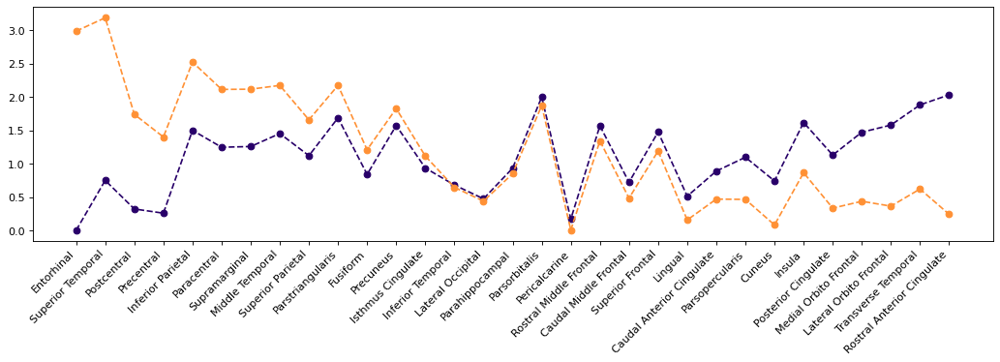

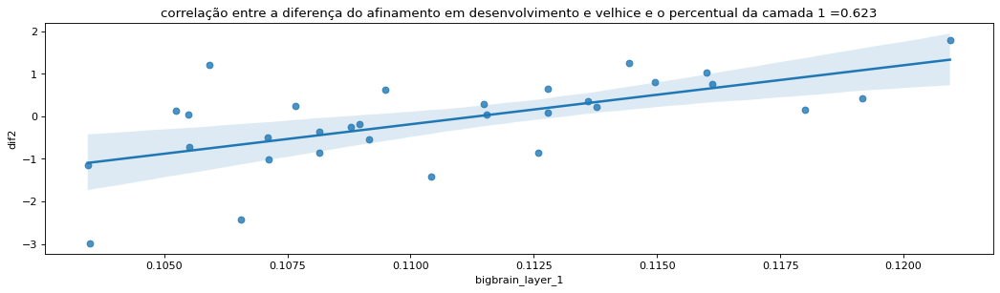

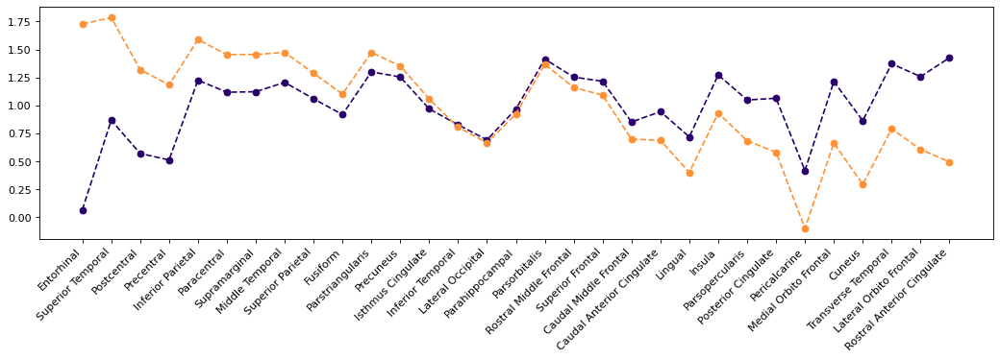

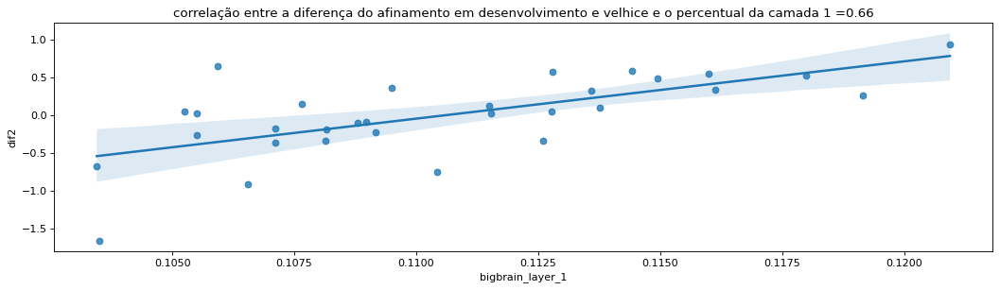

In [150]:
# calculando teste estatistico
df5_n = df5.copy()
df5_n['avg_rate1'] = df5['avg_rate1']/(df5['avg_rate1'].mean())
df5_n['avg_rate2'] = df5['avg_rate2']/(df5['avg_rate2'].mean())
df5_n['avg_rate3'] = df5['avg_rate3']/(df5['avg_rate3'].mean())

df5_n['dif2'] = df5_n.avg_rate1*df5_n.avg_rate1 - df5_n.avg_rate3*df5_n.avg_rate3
#df5_n['dif2'] = df5_n.avg_rate1 - df5_n.avg_rate3

x1 = -0.4 #[0.4;0.7]
x2 = -x1
g1 = df5_n[df5_n.dif2<x1]
g2 = df5_n[(df5_n.dif2>x1) & (df5_n.dif2<x2)]
g3 = df5_n[df5_n.dif2>x2]

print(len(g1), len(g2), len(g3))
print(g1.bigbrain_layer_1.mean(), g2.bigbrain_layer_1.mean(), g3.bigbrain_layer_1.mean())
from scipy import stats 
print(stats.kruskal(g1.bigbrain_layer_1,g2.bigbrain_layer_1,g2.bigbrain_layer_1)[1])
print(stats.f_oneway(g1.bigbrain_layer_1,g2.bigbrain_layer_1,g2.bigbrain_layer_1)[1])

# criando imagens
df5_n['dif2'] = df5_n.avg_rate1*df5_n.avg_rate1 - df5_n.avg_rate3*df5_n.avg_rate3
df5_n = df5_n.sort_values(by = 'dif2')
plt.figure(figsize=(16, 4), dpi=80)
plt.plot(df5_n.structure_name, df5_n.avg_rate1*df5_n.avg_rate1, '--o', color='#280069') 
plt.plot(df5_n.structure_name, df5_n.avg_rate3*df5_n.avg_rate3, '--o', color='#ff9135')
plt.xticks(rotation = 45, horizontalalignment = 'right') 
plt.show()

plt.figure(figsize=(16, 4), dpi=80)
corr = np.corrcoef(df5_n['bigbrain_layer_1'],df5_n.dif2)[0, 1]
sns.regplot(x='bigbrain_layer_1',y='dif2', data=df5_n).set(
    title="correlação entre a diferença do afinamento em desenvolvimento e velhice e o percentual da camada 1 ="+ str(np.round(corr,3)))
plt.show()

df5_n['dif2'] = df5_n.avg_rate1 - df5_n.avg_rate3
df5_n = df5_n.sort_values(by = 'dif2')
plt.figure(figsize=(16, 4), dpi=80)
plt.plot(df5_n.structure_name, df5_n.avg_rate1, '--o', color='#280069') 
plt.plot(df5_n.structure_name, df5_n.avg_rate3, '--o', color='#ff9135')
plt.xticks(rotation = 45, horizontalalignment = 'right') 
plt.show()

plt.figure(figsize=(16, 4), dpi=80)
corr = np.corrcoef(df5_n['bigbrain_layer_1'],df5_n.dif2)[0, 1]
sns.regplot(x='bigbrain_layer_1',y='dif2', data=df5_n).set(
    title="correlação entre a diferença do afinamento em desenvolvimento e velhice e o percentual da camada 1 ="+ str(np.round(corr,3)))
plt.show()

-------------

## 5. Old but important Code

#### 5.1. Criando anualrate.parquet

In [ ]:
# freesufer data
mri_subs_all = pp.read_parquet(mri_subs_path)
print('freesufer data')

# drop zeros and encode cats
mri_subs = pp.clean(mri_subs_all)
print('drop zeros and encode cats')

# quality assessment
bad_participants = pp.find_bad_ones(mri_areas_path)
mri_subs = pp.eliminate_bad_ones(bad_participants, mri_subs)
print('quality assessment')

# add identification features
mri_subs = pp.cat2int(mri_subs, cat_features=['sex', 'handedness', 'hemisphere'])
print('add identification features')

# add h_atlasDF
mri_subs['h_atlasDF'] = mri_subs.hemisphere.astype(str) + mri_subs.atlasDF.astype(str)
print('add h_atlasDF')

# add name atlas
print('add name strutures')


# add bigbrain features
mri_subs = pp.bb_features(bb_path, mri_subs)
print('add bigbrain')

# h_atlasDF to int
mri_subs['h_atlasDF'] = mri_subs['h_atlasDF'].replace('0-1', '-1')
mri_subs['h_atlasDF'] = mri_subs['h_atlasDF'].replace('1-1', '-1')
mri_subs.h_atlasDF.unique()

# create dict_groupby 
dict_groupby = {}
keys = ['participant',  'age', 'sex', 'handedness',
        'hemisphere', 'atlasDF', 'area', 'curv','sulc', 'thickness', 
        'bigbrain_layer_1','bigbrain_layer_2','bigbrain_layer_3','bigbrain_layer_4','bigbrain_layer_5','bigbrain_layer_6']

for key in keys:
    dict_groupby[key] = []
dict_groupby['h_atlasDF'] = []
print('create dict_groupby')

for i, participant in enumerate(mri_subs.participant.unique()):
    
    df = mri_subs[mri_subs.participant == participant].groupby(['h_atlasDF']).mean()
    df['participant_i'] = i
    df['participant'] = participant
    print(i)
    
    for key in keys:
        dict_groupby[key].extend(df[key])
    dict_groupby['h_atlasDF'].extend(df.index)

df0 = pd.DataFrame(dict_groupby)

df0.to_parquet("/home/brunovieira/Tamires_Experiments/Bases_de_Dados/MRI_2_anualrate_894_v2.parquet")
df0.head()

#### 5.2. Criando Age_Stable.csv

In [ ]:
#derivada = taxa_anual.idxmax(axis=1)
#derivada = derivada.reset_index()
#derivada['hemisferio'] = [a[0] for a in derivada['atlasEcono']]
#derivada['atlasEcono'] = [a[1:] for a in derivada['atlasEcono']]
#derivada['bigest_slope'] = np.array(taxa_anual.min(axis=1))
#derivada = derivada.rename(columns={'atlasEcono':'econo',0:'age_stable'})
#derivada.to_csv('/home/brunovieira/Tamires_Experiments/Bases_de_Dados/Age_Stable.csv')